<h1><center> Dover Jet analysis  </center></h1>
<div style="text-align: center"> 
    Dr. Harish Baki <br/> Postdoctoral researcher <br/> TU Delft, Netherlands <br/> Email: h.baki@tudelft.nl<br/>
</div>

In [66]:
import datetime
print(f'Updated: {datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")}')

Updated: 2024-06-12 19:05:33


In [67]:
import xarray as xr
from netCDF4 import Dataset
import os
import glob
import dask.distributed as dd
import dask
from dask import delayed
import dask.array as da
import time
import sys
import calendar
from datetime import datetime, timedelta
import numpy as np
import wrf
from itertools import product
import math

import wrf
from wrf import interplevel

import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['text.usetex'] = False

import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.dates import HourLocator, DateFormatter, MinuteLocator

import seaborn as sns
import cartopy
from cartopy import crs
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import NaturalEarthFeature
from matplotlib.cm import get_cmap
import matplotlib.colors as mcolors
import matplotlib.dates as mdates


root_dir = '/media/harish/SSD_4TB/EU_SCORES_project/CLLJ'
scripts_dir = f'{root_dir}/scripts'
sys.path.append(scripts_dir)

from data_processing.libraries import *

In [68]:
import dask.distributed as dd
if 'client' in locals():
    cluster.close()
    client.close()
cluster = dd.LocalCluster(n_workers=48, threads_per_worker=2, memory_limit='2GB',dashboard_address=f':8787')
client = dd.Client(cluster)
print(client)

2024-06-12 19:05:40,310 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-zgam4isk', purging
2024-06-12 19:05:40,311 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-v_h771bb', purging
2024-06-12 19:05:40,311 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-s15f9g8d', purging
2024-06-12 19:05:40,311 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-xd7gw95y', purging
2024-06-12 19:05:40,311 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-9m9_nws9', purging
2024-06-12 19:05:40,311 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-fthoj_db', purging
2024-06-12 19:05:40,312 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-3e1u1yg2', purging

<Client: 'tcp://127.0.0.1:45795' processes=48 threads=96, memory=89.41 GiB>


In [69]:
P1 = [41.132,-8.7]
P2 = [41.5236, -9.055]
P6 = [41.5236, -8.9]
target_grid = {'min_lat': 48, 'min_lon': -2,'max_lat':56,'max_lon':7}
heightAboveGround = [ 15.,  30.,  50.,  75., 100.0, 150.0, 200., 250., 300., 400., 500.]

In [70]:
files = ['CERRA_gridded_15_30_50_75_200_250_300_400_500_wind_2016_6.nc',
         'CERRA_gridded_100_m_wind_2016_6.nc',
         'CERRA_gridded_150_m_wind_2016_6.nc']
ws_rest = xr.open_dataset(f'{files[0]}').ws
ws_rest = regional_extraction(ws_rest,target_grid)
#ws = ws.reindex(heightAboveGround=heightAboveGround)
ws100 = xr.open_dataset(f'{files[1]}').ws
ws100 = regional_extraction(ws100,target_grid,lon_convert=True).assign_coords(longitude=ws_rest.longitude) # interestingly, the longitude values are in the order of 0 to 360
ws150 = xr.open_dataset(f'{files[2]}').ws
ws150 = regional_extraction(ws150,target_grid,lon_convert=True).assign_coords(longitude=ws_rest.longitude)

# Concatenate along heightAboveGround dimension
CERRA_ws = xr.concat([ws_rest, ws100, ws150], dim='heightAboveGround')
CERRA_ws = CERRA_ws.reindex(heightAboveGround=heightAboveGround)

#CERRA_temp = xr.open_dataset(f'{root_dir}/CERRA_gridded_height_level_temp_2011_7.nc').t
#CERRA_temp = regional_extraction(CERRA_temp,target_grid)

In [71]:
lsm = xr.open_dataset(f'{root_dir}/CERRA_landseamask.nc')['lsm']
lsm = regional_extraction(lsm,target_grid,lon_convert=True)

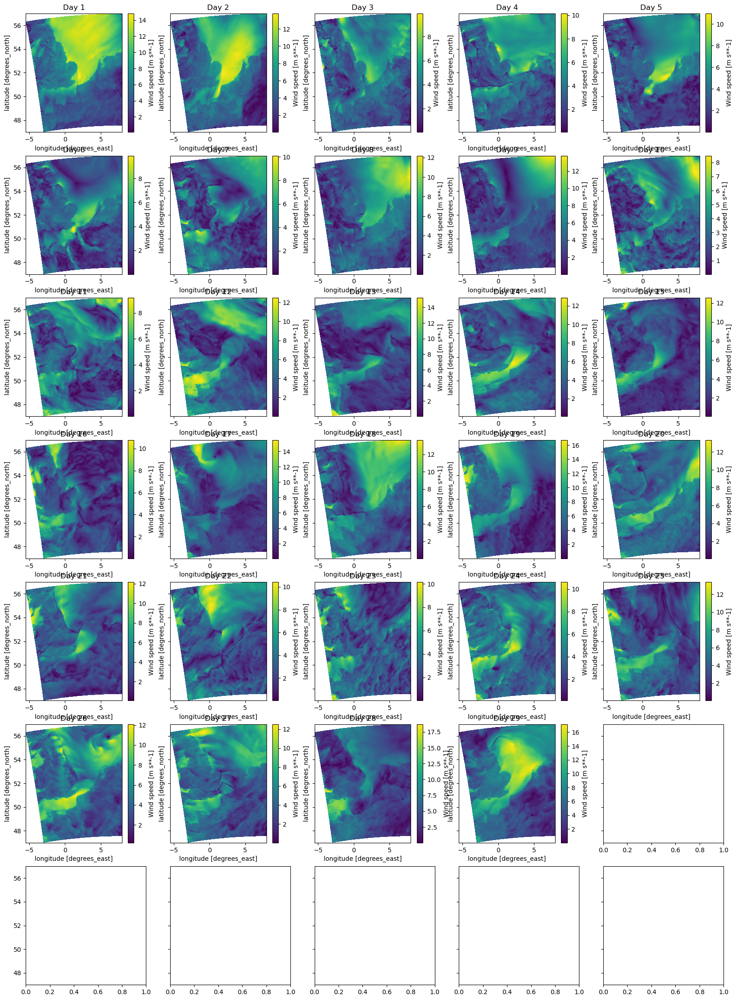

In [72]:
# Create a figure with 8 subplots
fig, axes = plt.subplots(nrows=7, ncols=5, figsize=(20, 28), sharey=True)
axes = axes.flatten()
for i, day in enumerate(range(1,30,1)):
    data = CERRA_ws.sel(heightAboveGround=15.).sel(time='2016-06-%0.2dT18:00:00'%day)
    data.plot(x='longitude',y='latitude',ax=axes[i])
    axes[i].set_title(f'Day {day}')

In [73]:
def detect_Doverjet_per_point_based_on_Christoffer(wind_speed,height,lsm,dim):
    '''
    https://wes.copernicus.org/articles/8/1651/2023/wes-8-1651-2023-discussion.html
    '''
    if lsm == 1:
        return False
    else:
        # Convert input arrays to xarray DataArrays if they are not already
        if not isinstance(wind_speed, xr.DataArray):
            wind_speed = xr.DataArray(wind_speed, dims=[dim], coords={dim: height})
        if not isinstance(height, xr.DataArray):
            height = xr.DataArray(height, dims=[dim])
        
        # 1. Core speed and core height: Local wind maximum within the lowest 1 km
        core_indice = wind_speed.argmax()
        core_speed = wind_speed.isel({dim:core_indice})
        core_height = height.isel({dim:core_indice})

        # 3. Fall off criteria
        below_core = wind_speed.sel({dim:slice(None, core_height)})
        above_core = wind_speed.sel({dim:slice(core_height, None)})

        increase_below = ((below_core <= core_speed - 1)).any(dim=dim) and ((below_core <= 0.9*core_speed)).any(dim=dim)
        decrease_above = ((above_core <= core_speed - 1)).any(dim=dim) and ((above_core <= 0.9*core_speed)).any(dim=dim)

        condition3 = increase_below & decrease_above

        # Combine all conditions
        cllj_condition = condition3

        #print(f"core high: {core_height.values},"
        #        f"core speed: {core_speed.values}, increase below: {increase_below.values}, decrease above: {decrease_above.values}," 
        #      f"condition3: {condition3.values}, inversion base height: {inversion_base_height.values}, condition4: {condition4.values}, "
        #      f"max temp level: {max_temp_level.values}, condition5: {condition5.values}, cllj: {cllj_condition.values}")
        return cllj_condition

def detect_Doverjet(wind_speed,lsm,dim='heightAboveGround'):
    height = wind_speed.coords[dim]

    # Apply the detect_CLLJ_per_point function across the dataset using Dask
    cllj_condition = xr.apply_ufunc(
        detect_Doverjet_per_point_based_on_Christoffer,
        wind_speed,
        height,
        lsm,
        dim,
        input_core_dims=[[dim], [dim],[],[]],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[bool]
    )
    
    return cllj_condition


In [74]:
# Assuming 'data' is an xarray Dataset containing wind speed and temperature profiles
wind_speed_chunk = CERRA_ws.chunk({'time':1,'y': 50, 'x': 50})
lsm_chunk = lsm.chunk({'y': 50, 'x': 50})

# Detect CLLJs
Doverjet_detection = detect_Doverjet(wind_speed_chunk,lsm_chunk).compute()

In [75]:
Doverjet_detection = Doverjet_detection.rename('doverjet')
Doverjet_detection.to_netcdf(f'CERRA_Doverjet_existence_June_2016_wind.nc')

In [76]:
Doverjet_detection = xr.open_dataset(f'CERRA_Doverjet_existence_June_2016_wind.nc')
Doverjet_detection = Doverjet_detection.assign_coords(longitude=ws_rest.longitude,latitude=ws_rest.latitude)

In [77]:
def map_plotter(gs,data,x,y,levels,cmap,title,shrink,colorbar,cbar_label,orientation,extent=None,rectangles=None,sample_points=None,fontsize=None,pad=None):    
    ax = fig.add_subplot(gs,projection=ccrs.PlateCarree())
    ax.coastlines()
    
    contour = data.plot.contourf(
        x=x,y=y,add_colorbar=False,cmap = cmap,extend='both',
        #cbar_kwargs = {'orientation':orientation, 'shrink':shrink, 'aspect':40, 'label':cbar_label,'fontsize':fontsize},
        ax=ax)
    
    # Add colorbar with font size
    if colorbar:
        cbar = fig.colorbar(contour, orientation=orientation, shrink=shrink, aspect=40, label=cbar_label,pad=pad)
        cbar.ax.tick_params(labelsize=fontsize)
        if orientation == 'horizontal':
            cbar.ax.set_xlabel(cbar_label, fontsize=fontsize)
            cbar.ax.xaxis.set_label_position('top')
        else:
            cbar.ax.set_ylabel(cbar_label, fontsize=fontsize)
            cbar.ax.yaxis.set_label_position('left')
            
    
    if extent:
        # Set the extent (for example, bounding box for Europe)
        ax.set_extent(extent, crs=ccrs.PlateCarree())
    
    # Add gridlines with labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    
    # Set x and y ticks font size
    gl.xlabel_style = {'size': fontsize}
    gl.ylabel_style = {'size': fontsize}
    
    # set title
    ax.set_title(title,fontsize=fontsize)
    
    # Add land feature with grey color
    land_feature = cfeature.NaturalEarthFeature(
        'physical', 'land', '10m', edgecolor='face', facecolor='lightgrey'
    )
    ax.add_feature(land_feature)
    ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=1, edgecolor='black')
    
    if sample_points:
        for label, (lat, lon) in sample_points.items():
            ax.text(lon, lat - 0.05, label, color='black', fontsize=fontsize, ha='center', va='center')
            ax.plot(lon, lat, '.', markersize=8,color='black')
    
    if rectangles:
        target_grid = {'min_lat': 41.25, 'min_lon': -9.35,'max_lat':41.8,'max_lon':-8.65}
        # Draw a rectangular boxes
        min_lon = target_grid['min_lon']
        min_lat = target_grid['min_lat']
        max_lon = target_grid['max_lon']
        max_lat = target_grid['max_lat']
        rect = matplotlib.patches.Rectangle((min_lon, min_lat), max_lon - min_lon, max_lat - min_lat,
                                        linestyle='--', linewidth=1, edgecolor='red', facecolor='none',zorder=10)
        ax.add_patch(rect)
        
    return ax

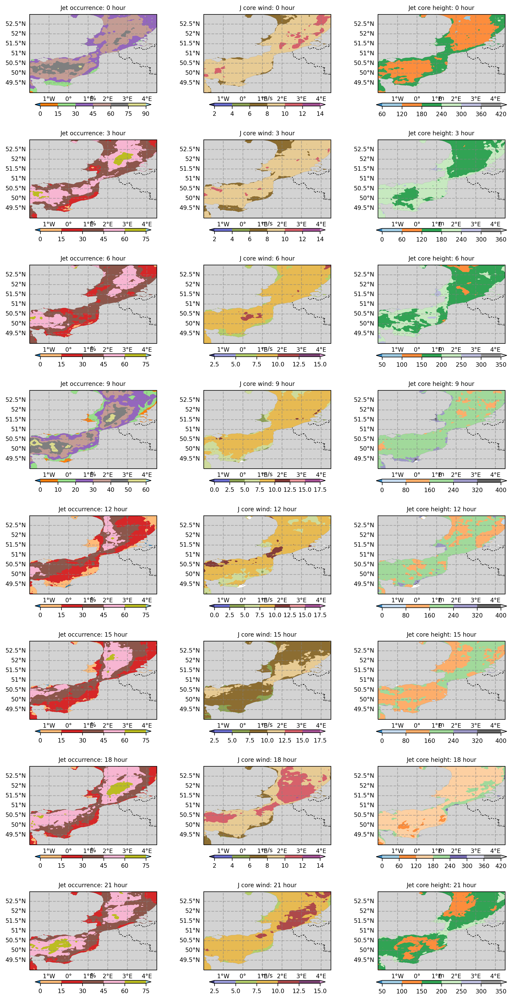

In [81]:
fig = plt.figure(figsize=(12,24), dpi=300)
gs = matplotlib.gridspec.GridSpec(8, 3)
extent = [-2, 4.5, 49, 53]

# Define the hours to plot (every 3rd hour from 0 to 21)
hours = list(range(0, 24, 3))
for i,hour in enumerate(hours):
    dj_freq = Doverjet_detection.doverjet.sel(time=Doverjet_detection.time.dt.hour == hour).mean(dim='time')*100
    core_wind = CERRA_ws.sel(time=CERRA_ws.time.dt.hour == hour).max(dim='heightAboveGround')
    core_height = CERRA_ws.heightAboveGround.isel(heightAboveGround=CERRA_ws.sel(time=CERRA_ws.time.dt.hour == hour).argmax('heightAboveGround'))

    data = dj_freq
    map_plotter(gs[i,0],data,x='longitude',y='latitude',levels=np.arange(0,75.1,5),cmap='tab20',
                title=f'Jet occurrence: {hour} hour',shrink=0.8,colorbar=True,cbar_label='%',
                orientation='horizontal',extent=extent,rectangles=True,fontsize=8,pad=0.1)

    data = core_wind.where(Doverjet_detection.doverjet).mean(dim='time')
    map_plotter(gs[i,1],data,x='longitude',y='latitude',levels=np.arange(5,15.1,1),cmap='tab20b',
                title=f'J core wind: {hour} hour',shrink=0.8,colorbar=True,cbar_label='m/s',
                orientation='horizontal',extent=extent,rectangles=True,fontsize=8,pad=0.1)

    data = core_height.where(Doverjet_detection.doverjet).mean(dim='time')
    map_plotter(gs[i,2],data,x='longitude',y='latitude',levels=np.arange(60,400.1,60),cmap='tab20c',
                title=f'Jet core height: {hour} hour',shrink=0.9,colorbar=True,cbar_label='m',
                orientation='horizontal',extent=extent,rectangles=True,fontsize=8,pad=0.1)
#plt.savefig(f'/home/harish/Dropbox/Apps/Overleaf/Assessment of Wind Energy Resources for Portugal at Super-Scale Resolution/IPCJ_occurrence_core_wind_core_height_July_2011_from_CERRA.pdf')

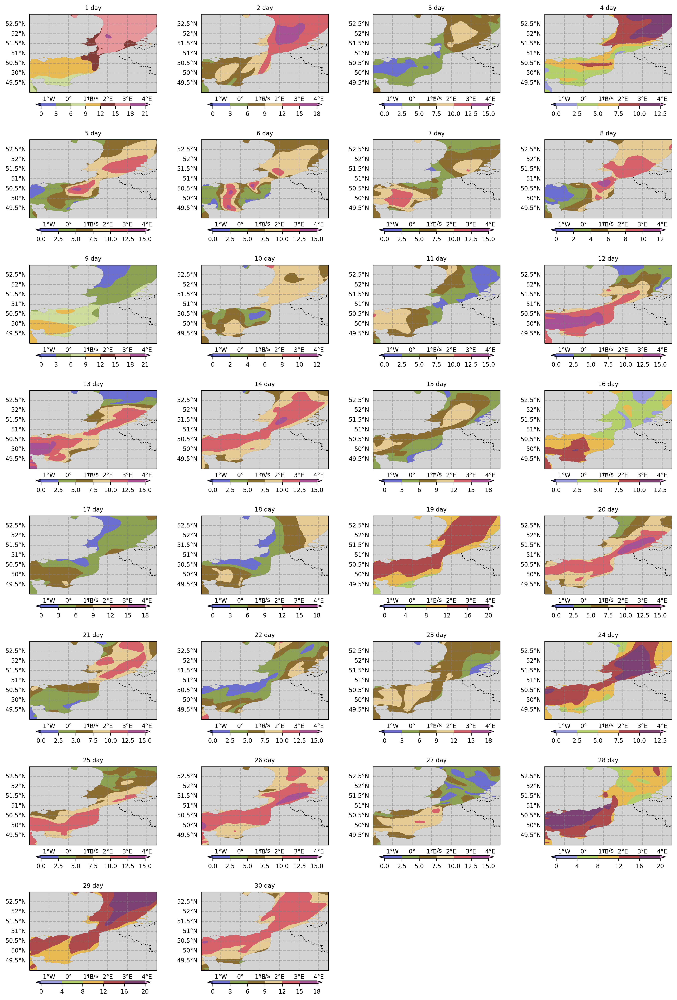

In [82]:
# Create a figure with 8 subplots
fig = plt.figure(figsize=(16,24), dpi=300)
gs = matplotlib.gridspec.GridSpec(8, 4)
extent = [-2, 4.5, 49, 53]
for i, day in enumerate(range(1,31,1)):
    data = CERRA_ws.sel(heightAboveGround=150.).sel(time='2016-06-%0.2dT21:00:00'%day)
    map_plotter(gs[i],data,x='longitude',y='latitude',levels=np.arange(5,15.1,1),cmap='tab20b',
                title=f'{day} day',shrink=0.8,colorbar=True,cbar_label='m/s',
                orientation='horizontal',extent=extent,rectangles=True,fontsize=8,pad=0.1)

### Cheching if jet frequency is highest or exist during 9th, 12th, 17th, and 18th 

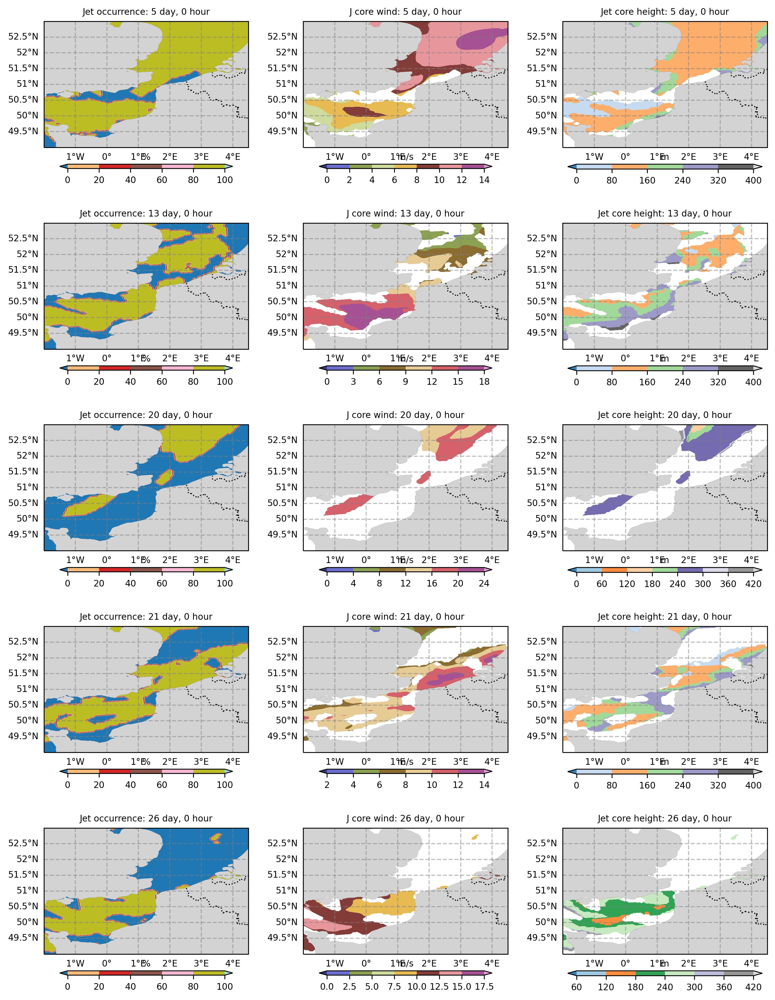

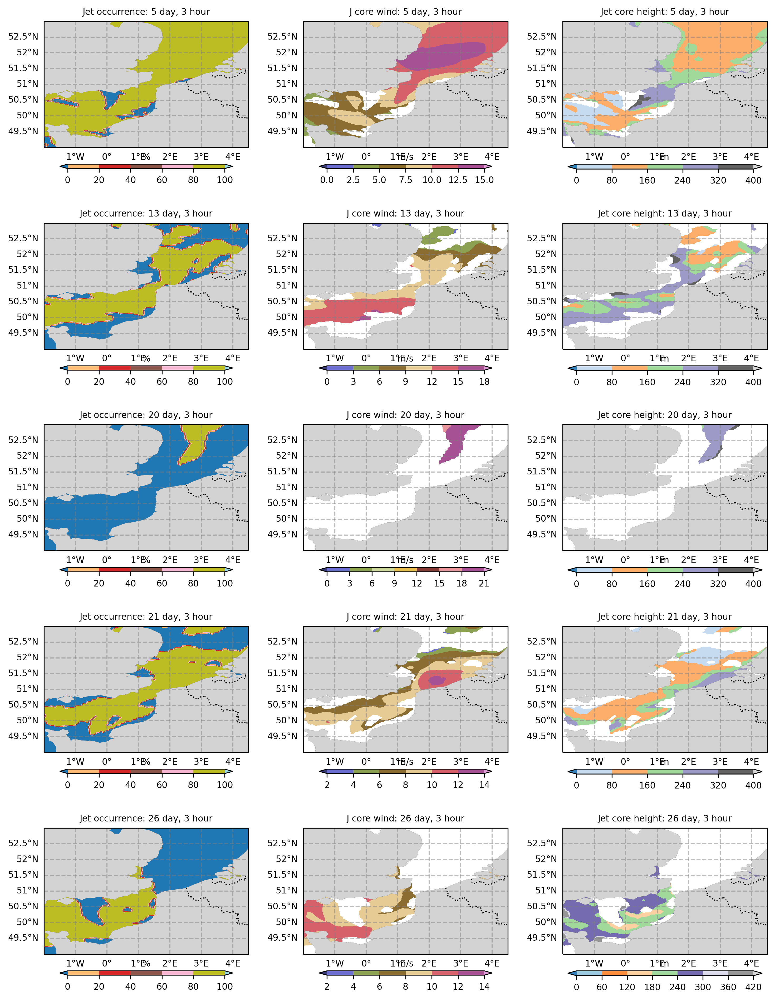

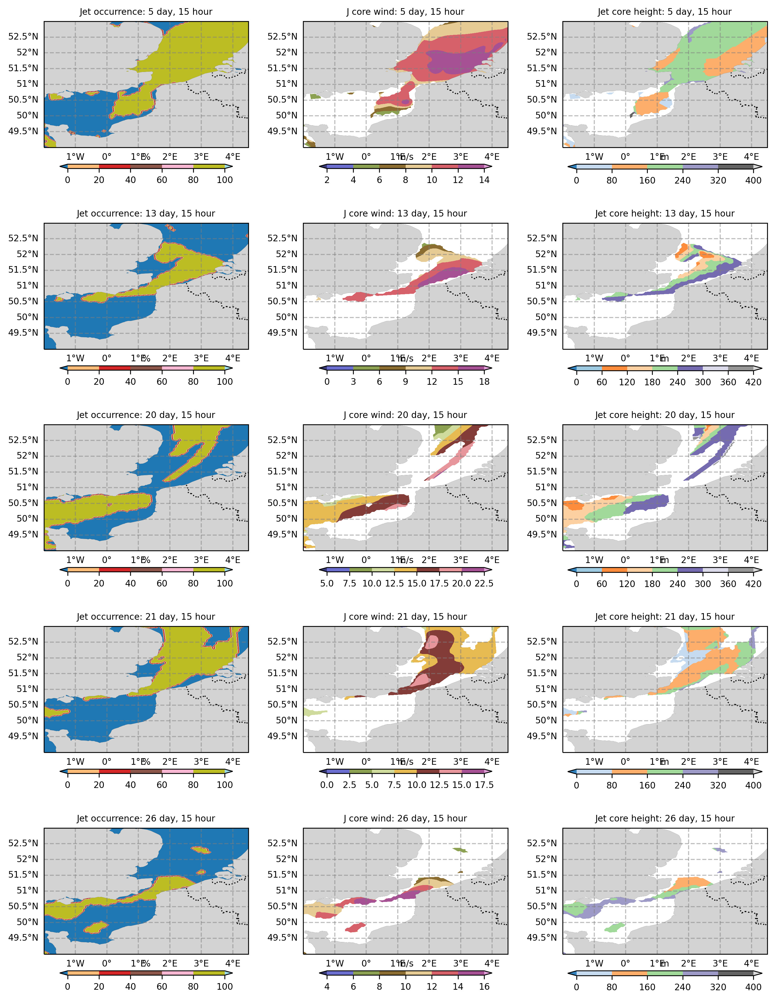

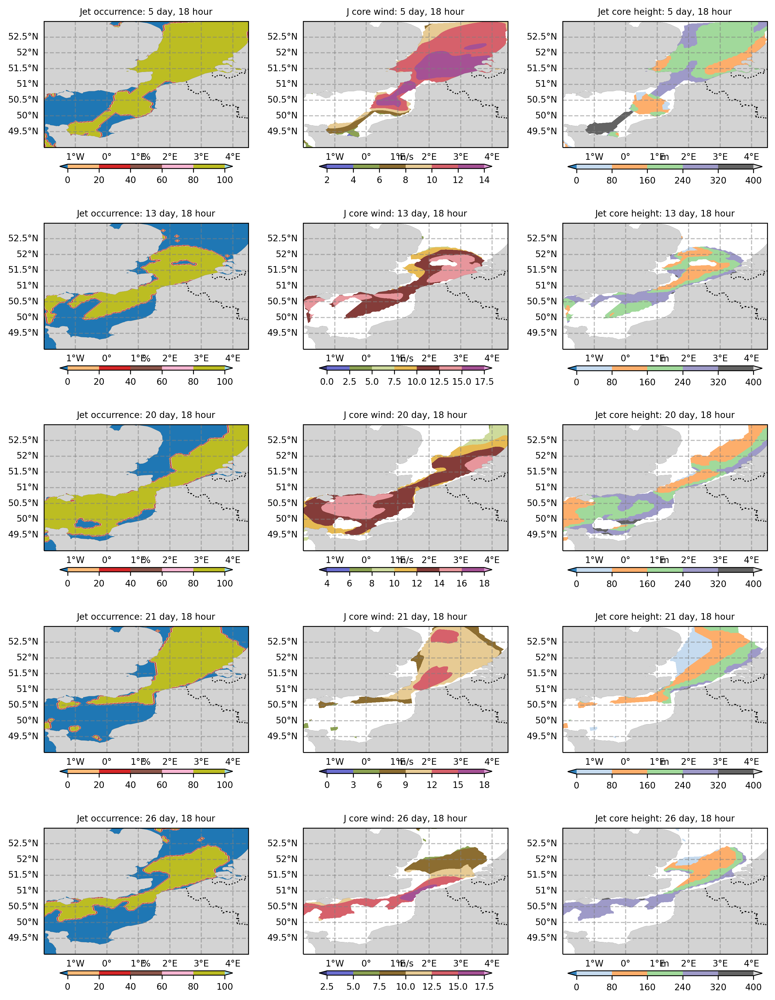

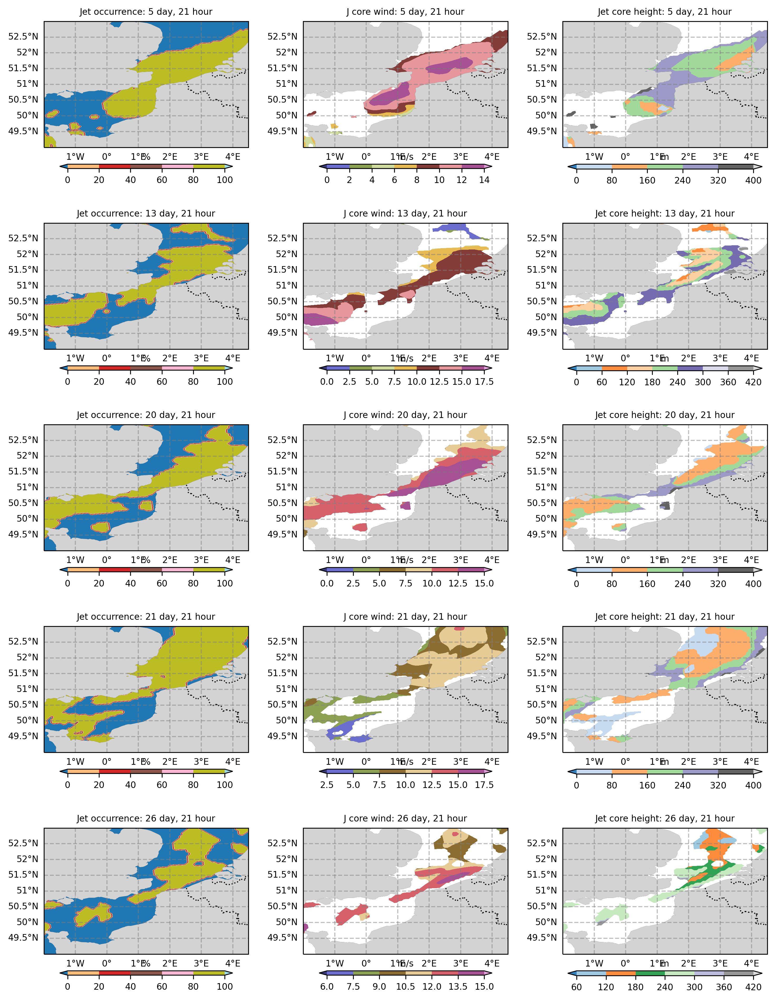

In [86]:
days = [5,13,20,21,26]
hours = [0,3,15,18,21]
for hour in hours:
    fig = plt.figure(figsize=(12,16), dpi=300)
    gs = matplotlib.gridspec.GridSpec(5, 3)
    extent = [-2, 4.5, 49, 53]
    for i,day in enumerate(days):
        dj_freq = Doverjet_detection.doverjet.sel(time='2016-06-%0.2dT%0.2d:00:00'%(day,hour))*100
        core_wind = CERRA_ws.sel(time='2016-06-%0.2dT%0.2d:00:00'%(day,hour)).max(dim='heightAboveGround')
        core_height = CERRA_ws.heightAboveGround.isel(heightAboveGround=CERRA_ws.sel(time='2016-06-%0.2dT%0.2d:00:00'%(day,hour)).argmax('heightAboveGround'))

        data = dj_freq
        map_plotter(gs[i,0],data,x='longitude',y='latitude',levels=np.arange(0,75.1,5),cmap='tab20',
                    title=f'Jet occurrence: {day} day, {hour} hour',shrink=0.8,colorbar=True,cbar_label='%',
                    orientation='horizontal',extent=extent,rectangles=True,fontsize=8,pad=0.1)

        data = core_wind.where(Doverjet_detection.doverjet.sel(time='2016-06-%0.2dT%0.2d:00:00'%(day,hour)))
        map_plotter(gs[i,1],data,x='longitude',y='latitude',levels=np.arange(5,15.1,1),cmap='tab20b',
                    title=f'J core wind: {day} day, {hour} hour',shrink=0.8,colorbar=True,cbar_label='m/s',
                    orientation='horizontal',extent=extent,rectangles=True,fontsize=8,pad=0.1)

        data = core_height.where(Doverjet_detection.doverjet.sel(time='2016-06-%0.2dT%0.2d:00:00'%(day,hour)))
        map_plotter(gs[i,2],data,x='longitude',y='latitude',levels=np.arange(60,400.1,60),cmap='tab20c',
                    title=f'Jet core height: {day} day, {hour} hour',shrink=0.9,colorbar=True,cbar_label='m',
                    orientation='horizontal',extent=extent,rectangles=True,fontsize=8,pad=0.1)